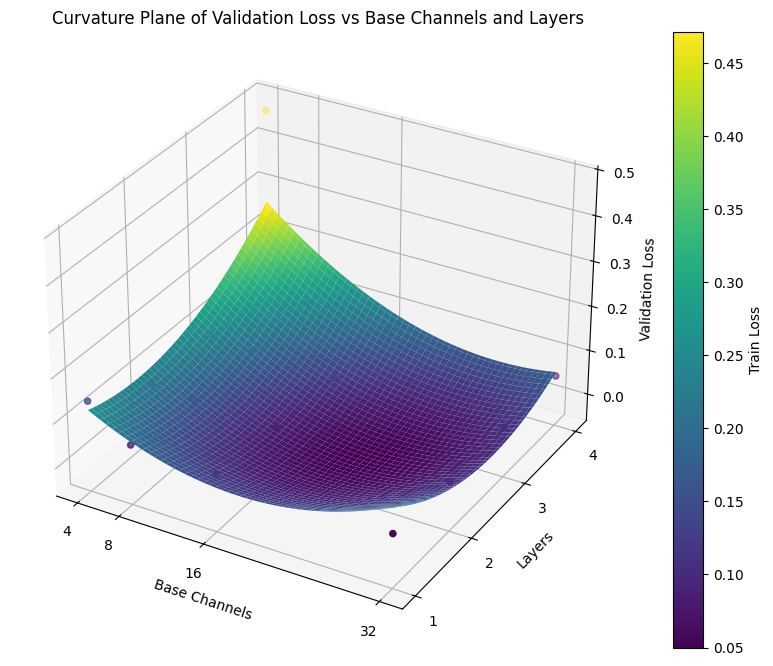

In [12]:
import json
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

epochs = []
base_channels = []
layers = []
train_losses = []
val_losses = []

with open('grid_search_results_autoencoder.json', 'r') as f:
    results = json.load(f)

for result in results:
    if result['epoch'] != 3:
        #print(result)
        continue
    epochs.append(result['epoch'])
    base_channels.append(result['base_channels'])
    layers.append(result['layers'])
    train_losses.append(result['train_loss'])
    val_losses.append(result['val_loss'])

# Define a quadratic function
def quadratic_func(x, a, b, c, d, e, f):#, g, h, i, j, k):
    return a * x[0]**2 + b * x[1]**2 + c * x[0] * x[1] + d * x[0] + e * x[1] + f #+ g * x[0]**3 + h * x[1]**3 + i * x[0]**2 * x[1] + j * x[0] * x[1]**2 + k * x[0]**2 * x[1]**2


# Convert lists to numpy arrays for curve fitting
base_channels_arr = np.array(base_channels)
layers_arr = np.array(layers)
train_losses_arr = np.array(val_losses)

# Fit the quadratic function to the loss values
popt, _ = curve_fit(quadratic_func, (base_channels_arr, layers_arr), train_losses_arr)

# Create a grid of base_channels and layers values
base_channels_grid, layers_grid = np.meshgrid(np.linspace(min(base_channels_arr), max(base_channels_arr), 100),
                                              np.linspace(min(layers_arr), max(layers_arr), 100))

# Calculate predicted train losses using the fitted quadratic function
train_losses_predicted = quadratic_func((base_channels_grid, layers_grid), *popt)

# Plot the curvature plane
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(base_channels_grid, layers_grid, train_losses_predicted, cmap='viridis')

# Add scatter plot of actual train losses
sc = ax.scatter(base_channels_arr, layers_arr, train_losses_arr, c=train_losses_arr, cmap='viridis', marker='o')

ax.set_xlabel('Base Channels')
ax.set_xticks([4,8,16,32])
ax.set_ylabel('Layers')
ax.set_yticks([1,2,3,4])
ax.set_zlabel('Validation Loss')
plt.title('Curvature Plane of Validation Loss vs Base Channels and Layers')

# Adding a color bar
cbar = plt.colorbar(sc)
cbar.set_label('Train Loss')

plt.show()

In [3]:
from dataclasses import dataclass, field

from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import torch

@dataclass
class UNetConfig:
  channels: list[int] = field(default_factory=lambda: [1, 16, 32, 64])  # number of chanels on first block, every next block is doubled
  res_dropout: float = field(default_factory=lambda: 0.2) # drop out applayed only to dropout
  kernel_size: int = field(default_factory=lambda: 3)
  @property
  def n_blocks(self):
    return len(self.channels) - 1 # number of blocks is one less then number of channels

@dataclass
class BlockConfig:
  channel: tuple[int, int] # number of in, out chanels in block
  rescale: bool # use maxpool or upsample
  kernel_size: int

class DownSampleBlock(nn.Module):
  def __init__(self, cfg: BlockConfig):
    super().__init__()
    self.block = nn.Sequential(
        nn.Conv2d(cfg.channel[0], cfg.channel[1], cfg.kernel_size, padding="same"),
        nn.ReLU(inplace=True),
        nn.Conv2d(cfg.channel[1], cfg.channel[1], cfg.kernel_size, padding="same"),
        nn.ReLU(inplace=True)
    )
    self.pool = nn.MaxPool2d(2) if cfg.rescale else None

  def forward(self, x):
    if self.pool is not None:
      x = self.pool(x)
    return self.block(x)

class UpSampleBlock(nn.Module):
  def __init__(self, cfg: BlockConfig):
    super().__init__()
    self.block = nn.Sequential(
        #nn.BatchNorm2d(cfg.channel[0]),
        nn.Conv2d(cfg.channel[0], cfg.channel[0], cfg.kernel_size, padding="same"),
        nn.ReLU(inplace=True),
        nn.Conv2d(cfg.channel[0], cfg.channel[1], cfg.kernel_size, padding="same"),
        nn.ReLU(inplace=True)
    )
    self.upsample = nn.Upsample(scale_factor=2) if cfg.rescale else None

  def forward(self, x):
    x = self.block(x)
    if self.upsample is not None:
      return self.upsample(x)
    return x

class UNet(nn.Module):
  def __init__(self, cfg: UNetConfig):
    super(UNet, self).__init__()
    self.cfg = cfg
    self.down_blocks = nn.ModuleList([])
    chs = cfg.channels
    for i in range(len(chs[:-1])): # [1, 16, 32; 64]
      self.down_blocks.append(DownSampleBlock(BlockConfig((chs[i], chs[i+1]), i != 0, cfg.kernel_size))) # i!=0 first block will have false for rescale

    self.up_blocks = nn.ModuleList([])
    chs = cfg.channels[::-1]
    for i in range(len(chs[:-1])): # in reverse order [64, 32, 16; 1]
      self.up_blocks.append(UpSampleBlock(BlockConfig((chs[i], chs[i+1]), i != cfg.n_blocks - 1, cfg.kernel_size)))

    self.res_dropout = nn.Dropout2d(cfg.res_dropout)

    self.sigmoid = nn.Sigmoid()


  def forward(self, x):
    ress = []
    for i, down in enumerate(self.down_blocks):
      x = down(x)
      if i < self.cfg.n_blocks - 1:
        ress.append(self.res_dropout(x))
    for i, up in enumerate(self.up_blocks):
      if i != 0: #< self.cfg.n_blocks - 1:
        x = x + ress[-i]
      x = up(x)

    return x


In [4]:
import torch
device = torch.device('cpu')
cfg = UNetConfig([1, 32, 64, 128], 0.) # Best [1, 32, 64, 128], 0.
#model = UNet(cfg)
model = torch.load('unet_without_rot.pth', map_location=device)

In [6]:
import torch
import torch.utils.data as data
import numpy as np
import os
import random
from PIL import Image
from torchvision.transforms import v2
from abc import ABC, abstractmethod
class NoiseGen(ABC):
    """
    Abstract class for noise generator
    """
    @abstractmethod
    def noise(self, x, y):
        """
        Generate noise with given size
        :param x: row size
        :param y: column size
        :return: noise matrix
        """
        raise NotImplementedError

class PoissonNoiseGen(NoiseGen):
    """
    Poisson noise generator note that this generate integer noise >= 0, so it needs to be scaled
    """
    def __init__(self, lam):
        self.lam = lam

    def noise(self, x, y):
        return np.random.poisson(self.lam, (x, y))

class PepperSaltNoiseGen(NoiseGen):
    """
    Pepper and salt noise generator
    """
    def __init__(self, p):
        self.p = p

    def noise(self, x, y):
        return np.random.binomial(1, self.p, (x, y))

class GaussianNoiseGen(NoiseGen):
    """
    Gaussian noise generator
    """
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def noise(self, x, y):
        return np.random.normal(self.mean, self.std, (x, y))

class CompositeNoise(NoiseGen):
    """
    Composite noise generator
    """
    def __init__(self, min_clip = 0.0, max_clip = 1.0, scale=1.0, value_prob=1.0) -> None:
        self.noises = []
        self.min_clip = min_clip
        self.max_clip = max_clip
        self.scale = scale
        self.value_prob = value_prob

    def add(self, noise, offset=0.0, scale=1.0, prob=1.0, value_prob=1.0, min_clip=0.0, max_clip=1.0):
        """
        Add noise to composite noise generator
        :param noise: noise generator
        :param offset: offset
        :param scale: scale
        :param prob: probability of applying this noise
        :param value_prob: probability of applying this noise to each pixel
        :param min_clip: minimum clamp
        :param max_clip: maximum clamp
        """
        self.noises.append({
            'noise': noise,
            'offset': offset,
            'scale': scale,
            'prob': prob,
            'value_prob': value_prob,
            'min_clip': min_clip,
            'max_clip': max_clip
        })

    def noise(self, x, y):
        noise = np.zeros((x, y),np.float32)
        for n in self.noises:
            if np.random.rand() > n['prob']: # skip this noise
                continue
            temp_noise = n['noise'].noise(x, y) * n['scale'] + n['offset']
            if n['value_prob'] < 1.0:
                temp_noise = np.where(np.random.rand(x, y) < n['value_prob'], temp_noise, 0.0)
            noise += np.clip(temp_noise , n['min_clip'], n['max_clip'])
        if self.value_prob < 1.0:
            noise = np.where(np.random.rand(x, y) < self.value_prob, noise, 0.0)
        return np.clip(self.scale*noise, self.min_clip, self.max_clip)

noise_gen = CompositeNoise(scale=0.1, value_prob=0.5)
noise_gen.add(GaussianNoiseGen(0, 0.2), scale=0.5, min_clip=-1.0)
noise_gen.add(PoissonNoiseGen(2), scale = 0.1)
noise_gen.add(PepperSaltNoiseGen(0.005), scale = 0.5)

In [19]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error
import numpy as np
from PIL import Image

img = np.array( Image.open('example.png'), np.float32)
img = (img - img.min()) / (img.max() - img.min())
# img crop to multiple of 32

x,y = img.shape[0], img.shape[1]
noise = noise_gen.noise(x,y)
noisy_img = img + noise

trans = transforms.Compose([transforms.ToTensor()])
noisy_img = trans(noisy_img)
out = None
with torch.no_grad():
    out = model(noisy_img.unsqueeze(0).to(device))

noisy_img = noisy_img.squeeze().cpu().numpy()
out = out.squeeze().cpu().numpy()
noisy_img = np.clip(noisy_img,0,1)
out = np.clip(out,0,1)

print("PSNR", psnr(img, out))
print("structural_similarity: ", ssim(img,out, data_range=1))
print("mean_squared_error", mean_squared_error(img, out))

out = Image.fromarray(np.uint8(out*255))
out.save('example_output_unet_5_4.png')
noisy_img = Image.fromarray(np.uint8(noisy_img*255))
noisy_img.save('example_n.png')

PSNR 36.94499922525967
structural_similarity:  0.8857307523199578
mean_squared_error 0.00020206917924645528


----- ORIGINAL ------
PSNR 34.472427127713246
SSIM:  0.8364042827207919
MSE 0.00035707322600437896
----- DENOISED ------
PSNR 36.942360211856034
SSIM:  0.8857492737458887
MSE 0.0002021920049667137



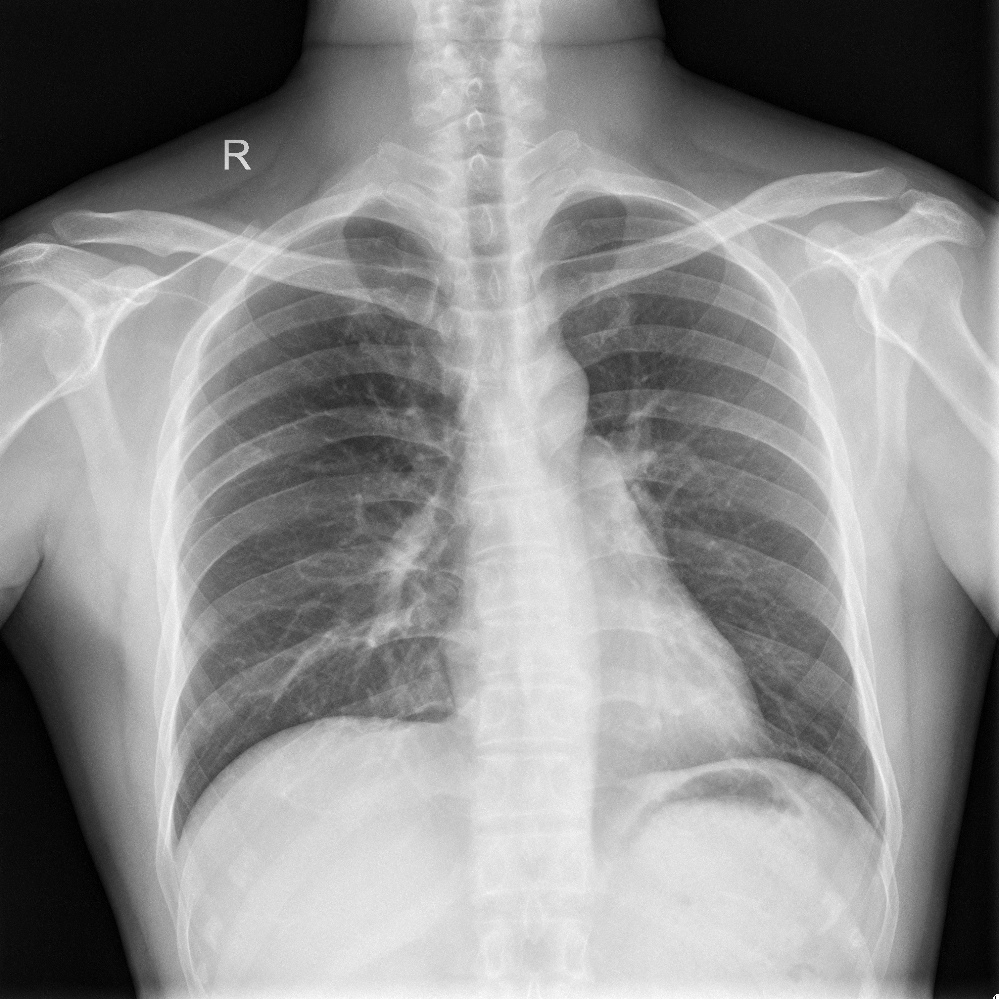
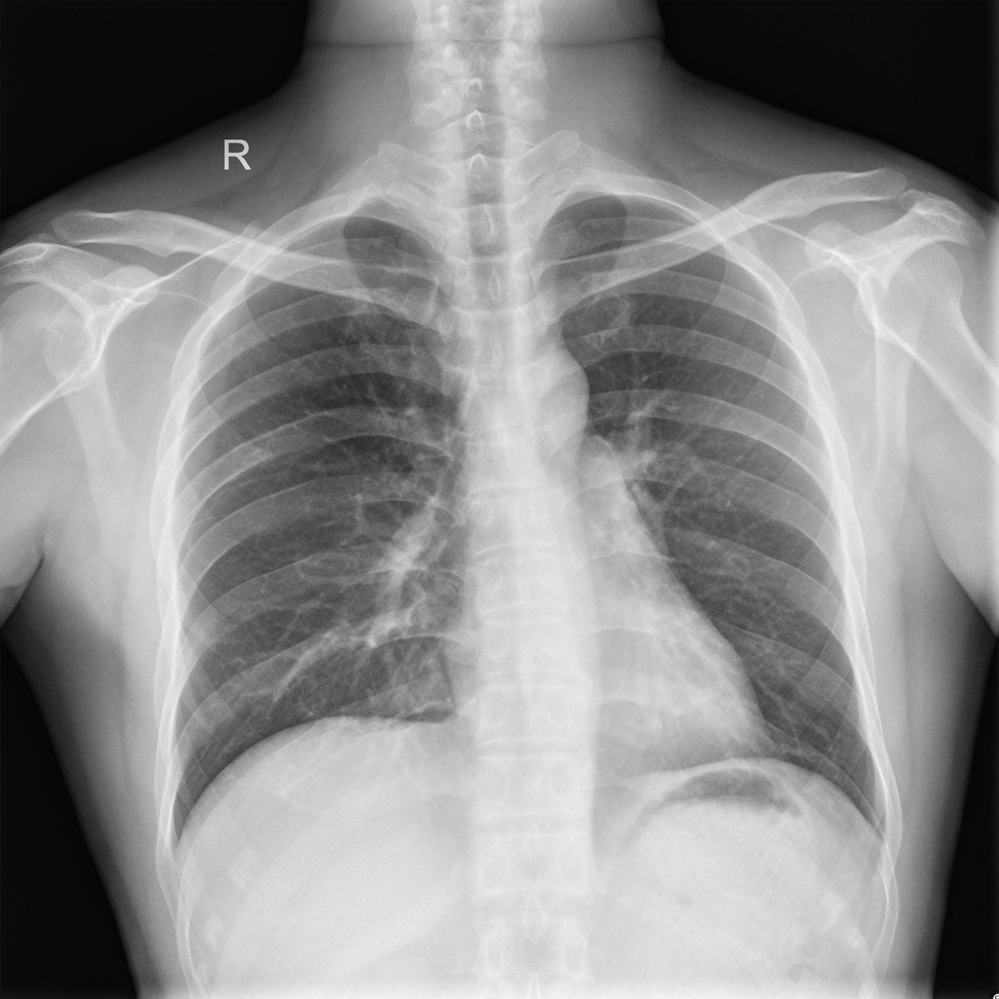

In [24]:
import leafmap
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error
import numpy as np
from PIL import Image

img = np.array( Image.open('example.png'), np.float32)
img = (img - img.min()) / (img.max() - img.min())
# img crop to multiple of 32

x,y = img.shape[0], img.shape[1]
noise = noise_gen.noise(x,y)
noisy_img = img + noise # Generate "noisy img"

trans = transforms.Compose([transforms.ToTensor()])
noisy_img = trans(noisy_img)
out = None
with torch.no_grad():
    out = model(noisy_img.unsqueeze(0).to(device))

noisy_img = noisy_img.squeeze().cpu().numpy()
out = out.squeeze().cpu().numpy()
noisy_img = np.clip(noisy_img,0,1)
out = np.clip(out,0,1)
print("----- ORIGINAL ------")
print("PSNR", psnr(img, noisy_img))
print("SSIM: ", ssim(img, noisy_img, data_range=1))
print("MSE", mean_squared_error(img, noisy_img))
print("----- DENOISED ------")
print("PSNR", psnr(img, out))
print("SSIM: ", ssim(img,out, data_range=1))
print("MSE", mean_squared_error(img, out))

out = Image.fromarray(np.uint8(out*255))
out.save('example_output_unet_5_4.png')
noisy_img = Image.fromarray(np.uint8(noisy_img*255))
noisy_img.save('example_n.png')


leafmap.image_comparison(
    "example_n.png",
    "example_output_unet_5_4.png",
    label1="Original Image",
    label2="Denoised",
    starting_position=50,
    out_html="image_comparison.html",
)